In [1]:
import os
import json
import pandas as pd
import numpy as np

In [2]:
stl_dataset = "./datasets/STL dataset"
files = [os.path.join(stl_dataset, x) for x in os.listdir(stl_dataset) if x.endswith(".json")]

In [3]:
files

['./datasets/STL dataset\\fashion-cat.json',
 './datasets/STL dataset\\fashion.json']

In [4]:
with open(files[0], "r") as f:
    categories = json.load(f)

In [5]:
categories

{'8870b0d384138a81cfdc91f98d1dde9b': 'Apparel & Accessories|Shoes',
 '70d392390fa258ba9b5d6b83ea29857e': 'Apparel & Accessories|Shoes',
 '2c05db9ff1abbcfc4bfd50dd003aac80': 'Apparel & Accessories|Clothing|Pants',
 '2b2cc3a8b588b7282be0511568b51ee7': 'Apparel & Accessories|Clothing|Shirts & Tops',
 'a141ed588bdaeccf1f695889a5aa7085': 'Apparel & Accessories|Clothing|Shorts',
 '17577154cfadd83e63d9d496b898e46b': 'Apparel & Accessories|Clothing|Pants',
 'd78116e7035b66180c953118edaca68f': 'Apparel & Accessories|Clothing|Shirts & Tops',
 'bfeab05381703b6b29365f7d1c1e8181': 'Apparel & Accessories|Shoes',
 'affb0234f39c54df9f490be0ed6e9ffa': 'Apparel & Accessories|Shoes',
 '46179a069d2546692bb5c31201a9c7ff': 'Apparel & Accessories|Shoes',
 '96f55744b378bea6ee93a080d0eb4be8': 'Apparel & Accessories|Shoes',
 '0d9fcfcd20e8bd29cc2739538bfa18ea': 'Apparel & Accessories|Clothing|Shirts & Tops',
 '77d80bac509c05b8c339afeb7a08e7ca': 'Apparel & Accessories|Clothing|Outerwear|Coats & Jackets',
 '420192

In [6]:
# Use a set to find unique values
unique_values = set(categories.values())
unique_values

{'Apparel & Accessories|Clothing Accessories|Sunglasses',
 'Apparel & Accessories|Clothing|Outerwear|Coats & Jackets',
 'Apparel & Accessories|Clothing|Pants',
 'Apparel & Accessories|Clothing|Shirts & Tops',
 'Apparel & Accessories|Clothing|Shorts',
 'Apparel & Accessories|Clothing|Skirts',
 'Apparel & Accessories|Handbags, Wallets & Cases',
 'Apparel & Accessories|Jewelry|Earrings',
 'Apparel & Accessories|Jewelry|Necklaces',
 'Apparel & Accessories|Shoes'}

In [7]:
#Now lets write a function to categorize the products depending on unique value found as shown above
def categorize(x):
    """
    Categorize products into 3 broad categories - Topwear, Bottomwear and Footwear
    """
    if x == 'Shoes':
        return 'footwear'
    elif x in ['Clothing|Pants', 'Clothing|Shorts', 'Clothing|Skirts']:
        return 'bottomwear'
    elif x == 'Clothing Accessories|Sunglasses':
        return 'eyewear'
    elif x == 'Handbags, Wallets & Cases':
        return 'handbags&cases'
    elif x in ['Jewelry|Necklaces','Jewelry|Earrings']:
        return 'jewelry'
    else:
        return 'topwear'


In [8]:
data = [json.loads(line) for line in open(files[1], 'r')]
data

[{'product': '0027e30879ce3d87f82f699f148bff7e',
  'scene': 'cdab9160072dd1800038227960ff6467',
  'bbox': [0.434097, 0.859363, 0.560254, 1.0]},
 {'product': '0027e30879ce3d87f82f699f148bff7e',
  'scene': '14f59334af4539132981b1324a731067',
  'bbox': [0.175269, 0.527773, 0.621485, 0.924899]},
 {'product': '0027e30879ce3d87f82f699f148bff7e',
  'scene': 'e7d32df9f45b691afc580808750f73ca',
  'bbox': [0.588666, 0.638503, 0.750647, 0.761368]},
 {'product': '0027e30879ce3d87f82f699f148bff7e',
  'scene': 'c0be585ed21b1a6c6dc9559ebe007ede',
  'bbox': [0.276699, 0.757741, 0.400485, 0.876138]},
 {'product': '002a6586b8381b5efd39410657630b44',
  'scene': '67ed2a06be8a26dc63d7a04d4e1a135f',
  'bbox': [0.154545, 0.144809, 0.809091, 0.784153]},
 {'product': '00f9272f652fde49cae740deab4efec4',
  'scene': 'b69e7fd5c674f2c57d983852f4cd8c2e',
  'bbox': [0.319045, 0.409877, 0.724975, 0.865827]},
 {'product': '01f7c942d5ea4b6032fdc45b385bf9d9',
  'scene': '3a006eb1c0159663d5b2bf5ad62ff5af',
  'bbox': [0.33

In [9]:
data = pd.DataFrame(data)
data

,product,scene,bbox
0,0027e30879ce3d87f82f699f148bff7e,cdab9160072dd1800038227960ff6467,"[0.434097, 0.859363, 0.560254, 1.0]"
1,0027e30879ce3d87f82f699f148bff7e,14f59334af4539132981b1324a731067,"[0.175269, 0.527773, 0.621485, 0.924899]"
2,0027e30879ce3d87f82f699f148bff7e,e7d32df9f45b691afc580808750f73ca,"[0.588666, 0.638503, 0.750647, 0.761368]"
3,0027e30879ce3d87f82f699f148bff7e,c0be585ed21b1a6c6dc9559ebe007ede,"[0.276699, 0.757741, 0.400485, 0.876138]"
4,002a6586b8381b5efd39410657630b44,67ed2a06be8a26dc63d7a04d4e1a135f,"[0.154545, 0.144809, 0.809091, 0.784153]"
...,...,...,...
72193,f47eacd512acfdcfaf5f402809acb333,0a8d63baa456499a3dd2c4886385cf13,"[0.456818, 0.343636, 0.75, 0.629091]"
72194,f47eacd512acfdcfaf5f402809acb333,31e3620642773bfeac3e9d1a4976205c,"[0.378297, 0.6209, 0.790087, 0.982056]"
72195,f940d17f294fec78c913e9536735bea1,cc764ccff4d6e1abb3ea1ecc1503f8bf,"[0.627266, 0.456562, 0.823383, 0.654216]"
72196,fd8de790fe45ef01ebc8fe47a6e80138,a1f27a961c577230d0cea68f6e59b36a,"[0.235259, 0.824805, 0.39719, 0.974153]"


In [10]:
data['category'] = data['product'].apply(lambda x: categories[x].replace('Apparel & Accessories|', ''))
data

,product,scene,bbox,category
0,0027e30879ce3d87f82f699f148bff7e,cdab9160072dd1800038227960ff6467,"[0.434097, 0.859363, 0.560254, 1.0]",Shoes
1,0027e30879ce3d87f82f699f148bff7e,14f59334af4539132981b1324a731067,"[0.175269, 0.527773, 0.621485, 0.924899]",Shoes
2,0027e30879ce3d87f82f699f148bff7e,e7d32df9f45b691afc580808750f73ca,"[0.588666, 0.638503, 0.750647, 0.761368]",Shoes
3,0027e30879ce3d87f82f699f148bff7e,c0be585ed21b1a6c6dc9559ebe007ede,"[0.276699, 0.757741, 0.400485, 0.876138]",Shoes
4,002a6586b8381b5efd39410657630b44,67ed2a06be8a26dc63d7a04d4e1a135f,"[0.154545, 0.144809, 0.809091, 0.784153]","Handbags, Wallets & Cases"
...,...,...,...,...
72193,f47eacd512acfdcfaf5f402809acb333,0a8d63baa456499a3dd2c4886385cf13,"[0.456818, 0.343636, 0.75, 0.629091]",Clothing|Shirts & Tops
72194,f47eacd512acfdcfaf5f402809acb333,31e3620642773bfeac3e9d1a4976205c,"[0.378297, 0.6209, 0.790087, 0.982056]",Clothing|Shirts & Tops
72195,f940d17f294fec78c913e9536735bea1,cc764ccff4d6e1abb3ea1ecc1503f8bf,"[0.627266, 0.456562, 0.823383, 0.654216]",Clothing Accessories|Sunglasses
72196,fd8de790fe45ef01ebc8fe47a6e80138,a1f27a961c577230d0cea68f6e59b36a,"[0.235259, 0.824805, 0.39719, 0.974153]",Shoes


In [11]:
data['category'].value_counts()

category
Shoes                                 22706
Clothing|Pants                        14289
Clothing|Shirts & Tops                11957
Handbags, Wallets & Cases              6322
Clothing|Outerwear|Coats & Jackets     4788
Clothing Accessories|Sunglasses        4577
Clothing|Shorts                        2752
Clothing|Skirts                        1872
Jewelry|Earrings                       1507
Jewelry|Necklaces                      1428
Name: count, dtype: int64

In [12]:
data['category'] = data['category'].apply(lambda x: categorize(x))
data['category'].value_counts()

category
footwear          22706
bottomwear        18913
topwear           16745
handbags&cases     6322
eyewear            4577
jewelry            2935
Name: count, dtype: int64

In [13]:
# # Remove rows where 'category' is equal to 'jewelry'

# Find the indices of rows where 'category' is equal to 'jewelry'
indices_to_drop = data[data['category'] == 'jewelry'].index

# Drop the rows using the indices
data = data.drop(indices_to_drop)

# Reset the index if needed
data = data.reset_index(drop=True)

data['category'].value_counts()

category
footwear          22706
bottomwear        18913
topwear           16745
handbags&cases     6322
eyewear            4577
Name: count, dtype: int64

In [14]:
# Reference: https://github.com/kang205/STL-Dataset
def convert_to_url(signature):
    """
    Convert Image signatures/ids to urls
    """
    prefix = 'http://i.pinimg.com/400x/%s/%s/%s/%s.jpg'
    return prefix % (signature[0:2], signature[2:4], signature[4:6], signature)

In [15]:
data['product'] = data['product'].apply(lambda x: convert_to_url(x))
data['scene'] = data['scene'].apply(lambda x: convert_to_url(x))
data

,product,scene,bbox,category
0,http://i.pinimg.com/400x/00/27/e3/0027e30879ce...,http://i.pinimg.com/400x/cd/ab/91/cdab9160072d...,"[0.434097, 0.859363, 0.560254, 1.0]",footwear
1,http://i.pinimg.com/400x/00/27/e3/0027e30879ce...,http://i.pinimg.com/400x/14/f5/93/14f59334af45...,"[0.175269, 0.527773, 0.621485, 0.924899]",footwear
2,http://i.pinimg.com/400x/00/27/e3/0027e30879ce...,http://i.pinimg.com/400x/e7/d3/2d/e7d32df9f45b...,"[0.588666, 0.638503, 0.750647, 0.761368]",footwear
3,http://i.pinimg.com/400x/00/27/e3/0027e30879ce...,http://i.pinimg.com/400x/c0/be/58/c0be585ed21b...,"[0.276699, 0.757741, 0.400485, 0.876138]",footwear
4,http://i.pinimg.com/400x/00/2a/65/002a6586b838...,http://i.pinimg.com/400x/67/ed/2a/67ed2a06be8a...,"[0.154545, 0.144809, 0.809091, 0.784153]",handbags&cases
...,...,...,...,...
69258,http://i.pinimg.com/400x/f4/7e/ac/f47eacd512ac...,http://i.pinimg.com/400x/0a/8d/63/0a8d63baa456...,"[0.456818, 0.343636, 0.75, 0.629091]",topwear
69259,http://i.pinimg.com/400x/f4/7e/ac/f47eacd512ac...,http://i.pinimg.com/400x/31/e3/62/31e362064277...,"[0.378297, 0.6209, 0.790087, 0.982056]",topwear
69260,http://i.pinimg.com/400x/f9/40/d1/f940d17f294f...,http://i.pinimg.com/400x/cc/76/4c/cc764ccff4d6...,"[0.627266, 0.456562, 0.823383, 0.654216]",eyewear
69261,http://i.pinimg.com/400x/fd/8d/e7/fd8de790fe45...,http://i.pinimg.com/400x/a1/f2/7a/a1f27a961c57...,"[0.235259, 0.824805, 0.39719, 0.974153]",footwear


In [16]:
data['XMIN'] = data['bbox'].apply(lambda x: x[0])
data['YMIN'] = data['bbox'].apply(lambda x: x[1])
data['XMAX'] = data['bbox'].apply(lambda x: x[2])
data['YMAX'] = data['bbox'].apply(lambda x: x[3])
data = data.drop(["bbox"], axis=1)
print("Total Pairs", data.shape[0])
data.head()

Total Pairs 69263


,product,scene,category,XMIN,YMIN,XMAX,YMAX
0,http://i.pinimg.com/400x/00/27/e3/0027e30879ce...,http://i.pinimg.com/400x/cd/ab/91/cdab9160072d...,footwear,0.434097,0.859363,0.560254,1.000000
1,http://i.pinimg.com/400x/00/27/e3/0027e30879ce...,http://i.pinimg.com/400x/14/f5/93/14f59334af45...,footwear,0.175269,0.527773,0.621485,0.924899
2,http://i.pinimg.com/400x/00/27/e3/0027e30879ce...,http://i.pinimg.com/400x/e7/d3/2d/e7d32df9f45b...,footwear,0.588666,0.638503,0.750647,0.761368
3,http://i.pinimg.com/400x/00/27/e3/0027e30879ce...,http://i.pinimg.com/400x/c0/be/58/c0be585ed21b...,footwear,0.276699,0.757741,0.400485,0.876138
4,http://i.pinimg.com/400x/00/2a/65/002a6586b838...,http://i.pinimg.com/400x/67/ed/2a/67ed2a06be8a...,handbags&cases,0.154545,0.144809,0.809091,0.784153


In [17]:
print("Number of Unique Products:\t", data["product"].nunique())
print("Number of Unique Scenes:\t", data["scene"].nunique())

Number of Unique Products:	 36276
Number of Unique Scenes:	 28671


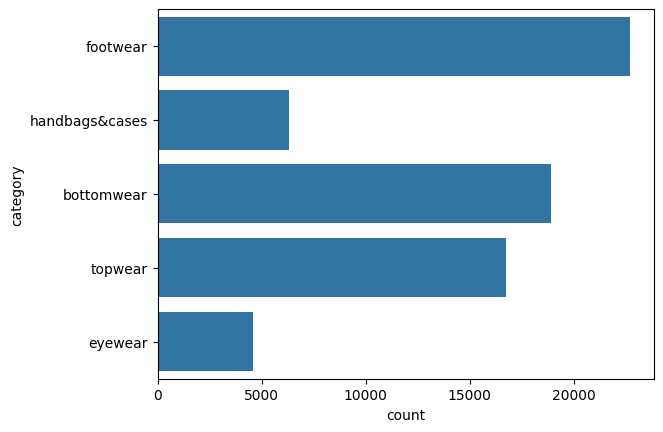

In [18]:
#Lets see the category counts
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(data["category"])
plt.show()

In [19]:
#Now lets create a seprate df for each type of category
topwear = data[data['category'] == 'topwear'].reset_index(drop=True)
bottomwear = data[data['category'] == 'bottomwear'].reset_index(drop=True)
footwear = data[data['category'] == 'footwear'].reset_index(drop=True)
eyewear = data[data['category'] == 'eyewear'].reset_index(drop=True)
handbags = data[data['category'] == 'handbags&cases'].reset_index(drop=True)

In [20]:
topwear

,product,scene,category,XMIN,YMIN,XMAX,YMAX
0,http://i.pinimg.com/400x/06/a0/ca/06a0ca42c853...,http://i.pinimg.com/400x/80/2e/1a/802e1ab859c6...,topwear,0.314011,0.504457,0.726989,0.862764
1,http://i.pinimg.com/400x/0b/9e/3a/0b9e3a1286a9...,http://i.pinimg.com/400x/de/76/6c/de766c8525f1...,topwear,0.179902,0.397577,0.577241,0.654606
2,http://i.pinimg.com/400x/0b/bf/26/0bbf2655ecf5...,http://i.pinimg.com/400x/37/08/aa/3708aa311b71...,topwear,0.544858,0.612022,0.724289,0.735883
3,http://i.pinimg.com/400x/0b/bf/26/0bbf2655ecf5...,http://i.pinimg.com/400x/00/72/b7/0072b7a4fd8d...,topwear,0.470037,0.884360,0.629634,0.985847
4,http://i.pinimg.com/400x/0b/bf/26/0bbf2655ecf5...,http://i.pinimg.com/400x/e8/55/d4/e855d4cb7c27...,topwear,0.369021,0.236794,0.562642,0.291439
...,...,...,...,...,...,...,...
16740,http://i.pinimg.com/400x/ee/19/c8/ee19c878014b...,http://i.pinimg.com/400x/e9/44/6f/e9446f455f22...,topwear,0.260178,0.460060,0.648367,0.798631
16741,http://i.pinimg.com/400x/f1/86/17/f18617313872...,http://i.pinimg.com/400x/11/57/7a/11577a2ed35e...,topwear,0.536870,0.567285,0.809951,0.928722
16742,http://i.pinimg.com/400x/f4/7e/ac/f47eacd512ac...,http://i.pinimg.com/400x/0a/8d/63/0a8d63baa456...,topwear,0.456818,0.343636,0.750000,0.629091
16743,http://i.pinimg.com/400x/f4/7e/ac/f47eacd512ac...,http://i.pinimg.com/400x/31/e3/62/31e362064277...,topwear,0.378297,0.620900,0.790087,0.982056


In [21]:
topwear["product"][0]

'http://i.pinimg.com/400x/06/a0/ca/06a0ca42c853b643a5ac6fd0e61664fa.jpg'

In [22]:
topwear["scene"][0]

'http://i.pinimg.com/400x/80/2e/1a/802e1ab859c65f1b0978b6e76bbf014e.jpg'

In [23]:
from tqdm import tqdm
from PIL import Image
from skimage import io
import random

def download_images(dataframe, target_folder):  
    
    #Download images by using the URL and save it locally.
    
    embeddings_dir = "embeddings_train_data"
    data = list()
    if not os.path.exists(embeddings_dir):
        os.mkdir(embeddings_dir)
    for i, row in tqdm(dataframe.iterrows(), total=dataframe.shape[0]):
        try:
            product_url, product_name = row["product"], row["product"].split("/")[-1]
            scene_url, scene_name = row["scene"], row["scene"].split("/")[-1]
            target_dir = os.path.join(embeddings_dir, target_folder)
            if not os.path.exists(target_dir):
                os.mkdir(target_dir)
                os.mkdir(os.path.join(target_dir, "anchor"))
                os.mkdir(os.path.join(target_dir, "positive"))
            if not os.path.isfile(os.path.join(target_dir, "anchor", product_name)):
                product = Image.fromarray(io.imread(product_url))
                product.save(os.path.join(target_dir, "anchor", product_name))
            if not os.path.isfile(os.path.join(target_dir, "positive", scene_name)):
                scene = io.imread(scene_url)
                XMIN, YMIN, XMAX, YMAX = int(scene.shape[1] * row['XMIN']), int(scene.shape[0] * row['YMIN']), int(scene.shape[1] * row['XMAX']), int(scene.shape[0] * row['YMAX']) 
                scene = Image.fromarray(scene[YMIN:YMAX, XMIN:XMAX])
                scene.save(os.path.join(target_dir, "positive", scene_name))
            data.append((os.path.join(target_dir, "anchor", product_name), os.path.join(target_dir, "positive", scene_name)))
        except Exception as e:
            print(f"Error: {e}")
            continue
    return data

def create_negative(List, positive):
 
    #Select a random image from the same category that will act as negative samples.

    negative = random.choice(List)
    if negative != positive:
        return negative
    else:
        create_negative(List, positive)
        
def plot_samples(dataframe, size=4, random_state=4):
    """
    Plot Anchor, Positive and Negative images in a row for a given batch of images.
    """
    for _, row in dataframe.sample(n=size, random_state=random_state).iterrows():
        anchor, positive, negative = row["anchor"], row["positive"], row["negative"] 
        anchor, positive, negative = io.imread(anchor), io.imread(positive), io.imread(negative)
        plt.figure(figsize=(16,9))
        plt.subplot(131)
        plt.imshow(anchor)
        plt.axis("off"); plt.title("Anchor")
        plt.subplot(132)
        plt.imshow(positive)
        plt.axis("off"); plt.title("Positive")
        plt.subplot(133)
        plt.imshow(negative)
        plt.axis("off"); plt.title("Negative")
        plt.show() 

 37%|███▋      | 6185/16745 [58:23<2:18:46,  1.27it/s]

Error: HTTP Error 403: Forbidden


 40%|████      | 6779/16745 [1:03:43<1:28:55,  1.87it/s]

Error: HTTP Error 403: Forbidden


 55%|█████▌    | 9234/16745 [1:22:08<1:19:31,  1.57it/s]

Error: HTTP Error 403: Forbidden


100%|██████████| 16745/16745 [2:31:36<00:00,  1.84it/s]  


Total Pairs:  16742


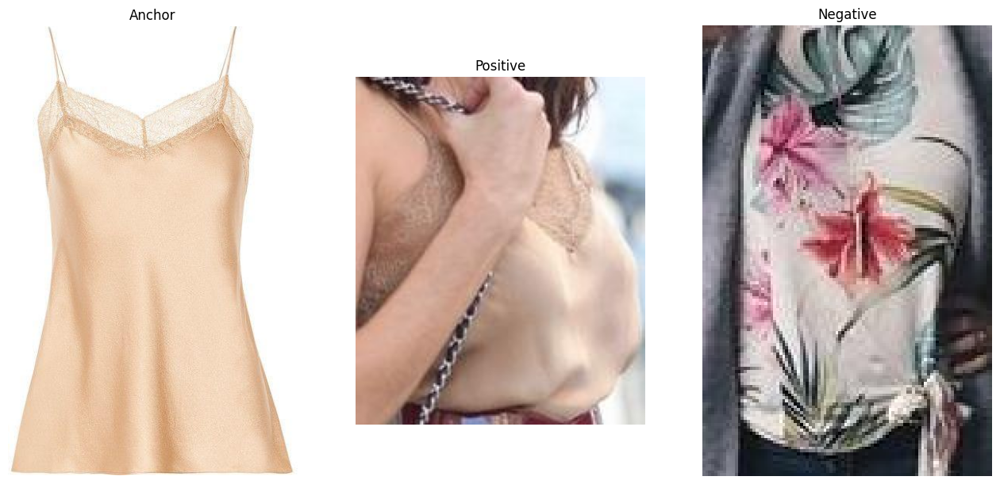

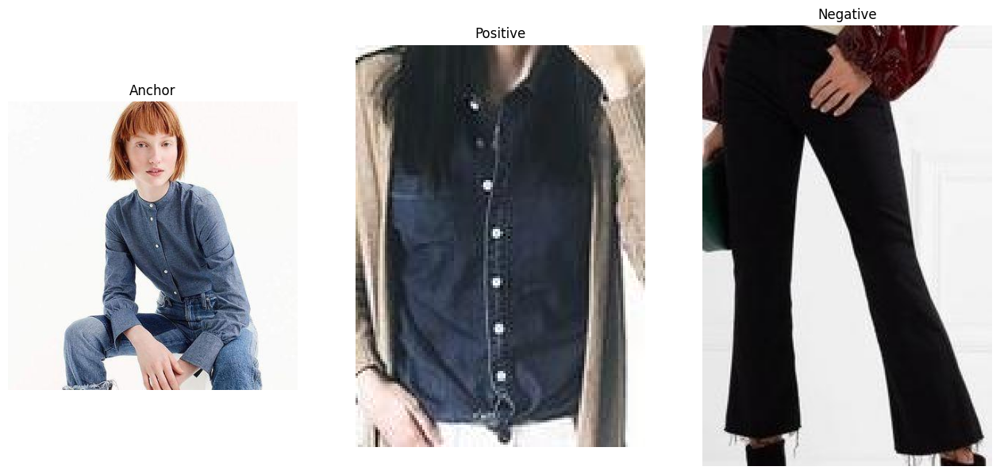

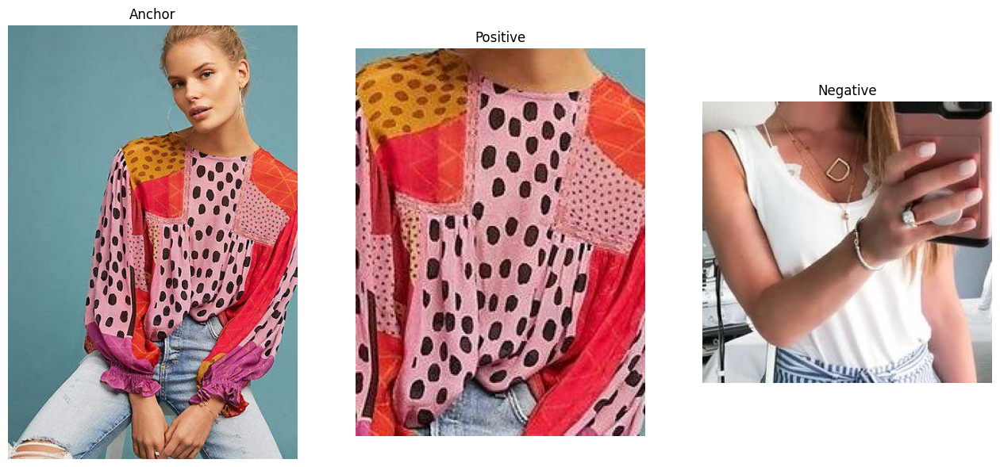

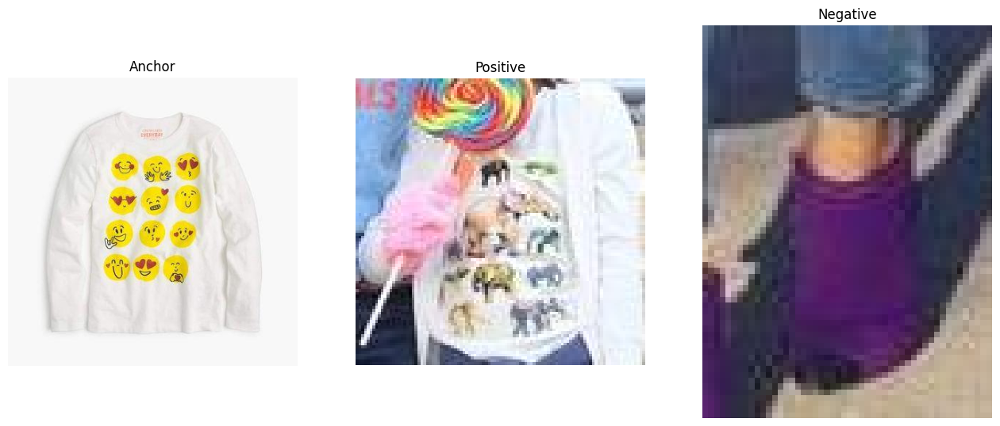

In [47]:
#Lets first download and vizualize the topwear data
topwear_pairs = download_images(topwear, "topwear")

topwear_pairs_csv = pd.DataFrame(topwear_pairs, columns=["anchor", "positive"])
topwear_pairs_csv["negative"] = topwear_pairs_csv["positive"].apply(lambda x: create_negative(topwear_pairs_csv.positive.to_list(), x)) 
print("Total Pairs: ", topwear_pairs_csv.shape[0])
topwear_pairs_csv.to_csv("top_pairs.csv", index=False)  #Lets save this dataframe as a csv

plot_samples(topwear_pairs_csv)

In [24]:
bottomwear_pairs = download_images(bottomwear, "bottomwear")

 13%|█▎        | 2420/18913 [00:00<00:06, 2532.08it/s]

Error: HTTP Error 403: Forbidden


 34%|███▍      | 6444/18913 [09:44<4:44:04,  1.37s/it]

Error: HTTP Error 403: Forbidden


 46%|████▌     | 8617/18913 [28:22<33:48,  5.08it/s]  

Error: HTTP Error 403: Forbidden


 68%|██████▊   | 12878/18913 [1:02:09<28:19,  3.55it/s]

Error: HTTP Error 403: Forbidden


 76%|███████▋  | 14435/18913 [1:12:52<25:28,  2.93it/s]  

Error: HTTP Error 403: Forbidden


100%|██████████| 18913/18913 [1:50:16<00:00,  2.86it/s]  


In [25]:
bottom_pairs_csv = pd.DataFrame(bottomwear_pairs, columns=["anchor", "positive"])
bottom_pairs_csv["negative"] = bottom_pairs_csv["positive"].apply(lambda x: create_negative(bottom_pairs_csv.positive.to_list(), x))
print("Total Pairs: ", bottom_pairs_csv.shape[0])

Total Pairs:  18908


In [26]:
bottom_pairs_csv.isna().sum()

anchor      0
positive    0
negative    3
dtype: int64

In [27]:
bottom_pairs_csv

,anchor,positive,negative
0,embeddings_train_data\bottomwear\anchor\00f927...,embeddings_train_data\bottomwear\positive\b69e...,embeddings_train_data\bottomwear\positive\8897...
1,embeddings_train_data\bottomwear\anchor\01f7c9...,embeddings_train_data\bottomwear\positive\3a00...,embeddings_train_data\bottomwear\positive\8acf...
2,embeddings_train_data\bottomwear\anchor\01f7c9...,embeddings_train_data\bottomwear\positive\3722...,embeddings_train_data\bottomwear\positive\19c8...
3,embeddings_train_data\bottomwear\anchor\01f7c9...,embeddings_train_data\bottomwear\positive\7407...,embeddings_train_data\bottomwear\positive\81a8...
4,embeddings_train_data\bottomwear\anchor\060624...,embeddings_train_data\bottomwear\positive\4f52...,embeddings_train_data\bottomwear\positive\9a7a...
...,...,...,...
18903,embeddings_train_data\bottomwear\anchor\865da1...,embeddings_train_data\bottomwear\positive\b300...,embeddings_train_data\bottomwear\positive\7ee2...
18904,embeddings_train_data\bottomwear\anchor\865da1...,embeddings_train_data\bottomwear\positive\0095...,embeddings_train_data\bottomwear\positive\39b3...
18905,embeddings_train_data\bottomwear\anchor\c4394f...,embeddings_train_data\bottomwear\positive\96d9...,embeddings_train_data\bottomwear\positive\412b...
18906,embeddings_train_data\bottomwear\anchor\ca74ee...,embeddings_train_data\bottomwear\positive\8893...,embeddings_train_data\bottomwear\positive\88e8...


In [29]:
bottom_pairs_csv.dropna(inplace=True)
bottom_pairs_csv

,anchor,positive,negative
0,embeddings_train_data\bottomwear\anchor\00f927...,embeddings_train_data\bottomwear\positive\b69e...,embeddings_train_data\bottomwear\positive\8897...
1,embeddings_train_data\bottomwear\anchor\01f7c9...,embeddings_train_data\bottomwear\positive\3a00...,embeddings_train_data\bottomwear\positive\8acf...
2,embeddings_train_data\bottomwear\anchor\01f7c9...,embeddings_train_data\bottomwear\positive\3722...,embeddings_train_data\bottomwear\positive\19c8...
3,embeddings_train_data\bottomwear\anchor\01f7c9...,embeddings_train_data\bottomwear\positive\7407...,embeddings_train_data\bottomwear\positive\81a8...
4,embeddings_train_data\bottomwear\anchor\060624...,embeddings_train_data\bottomwear\positive\4f52...,embeddings_train_data\bottomwear\positive\9a7a...
...,...,...,...
18903,embeddings_train_data\bottomwear\anchor\865da1...,embeddings_train_data\bottomwear\positive\b300...,embeddings_train_data\bottomwear\positive\7ee2...
18904,embeddings_train_data\bottomwear\anchor\865da1...,embeddings_train_data\bottomwear\positive\0095...,embeddings_train_data\bottomwear\positive\39b3...
18905,embeddings_train_data\bottomwear\anchor\c4394f...,embeddings_train_data\bottomwear\positive\96d9...,embeddings_train_data\bottomwear\positive\412b...
18906,embeddings_train_data\bottomwear\anchor\ca74ee...,embeddings_train_data\bottomwear\positive\8893...,embeddings_train_data\bottomwear\positive\88e8...


In [30]:
bottom_pairs_csv.isna().sum()

anchor      0
positive    0
negative    0
dtype: int64

In [31]:
bottom_pairs_csv.to_csv("bottom_pairs.csv", index=False)

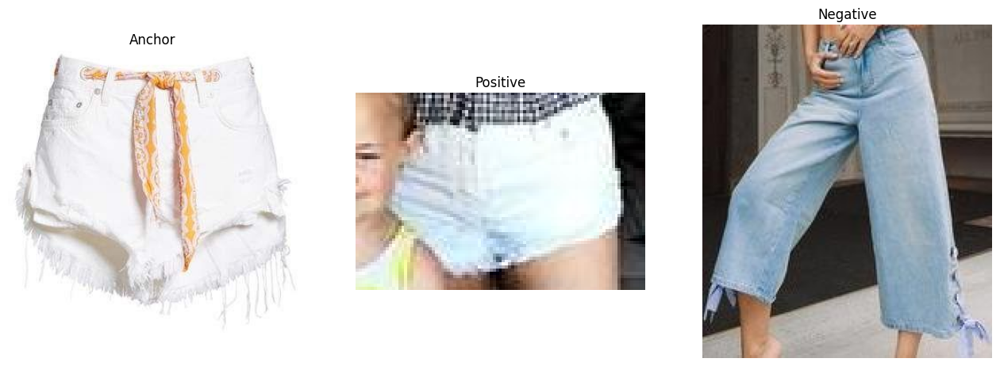

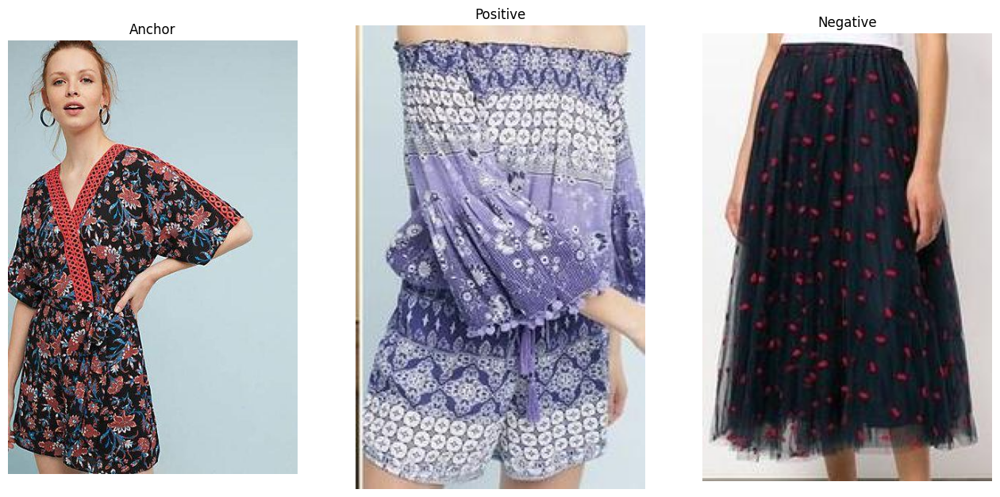

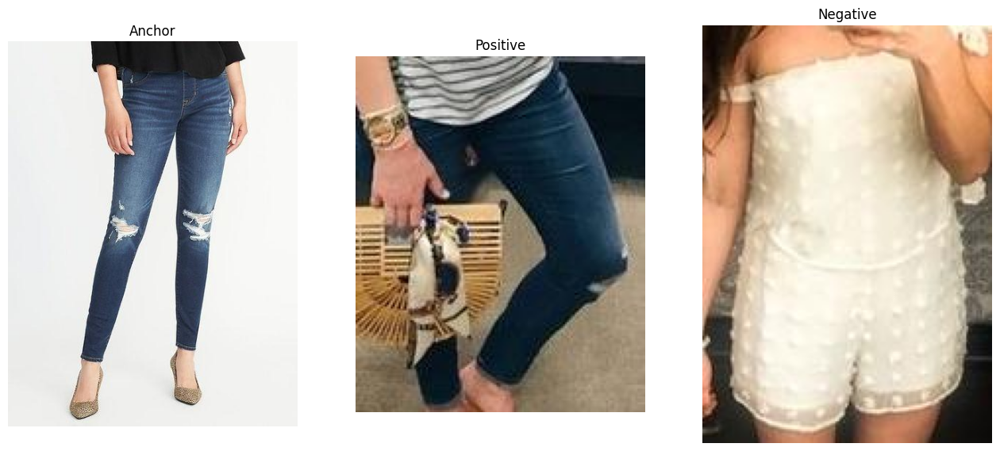

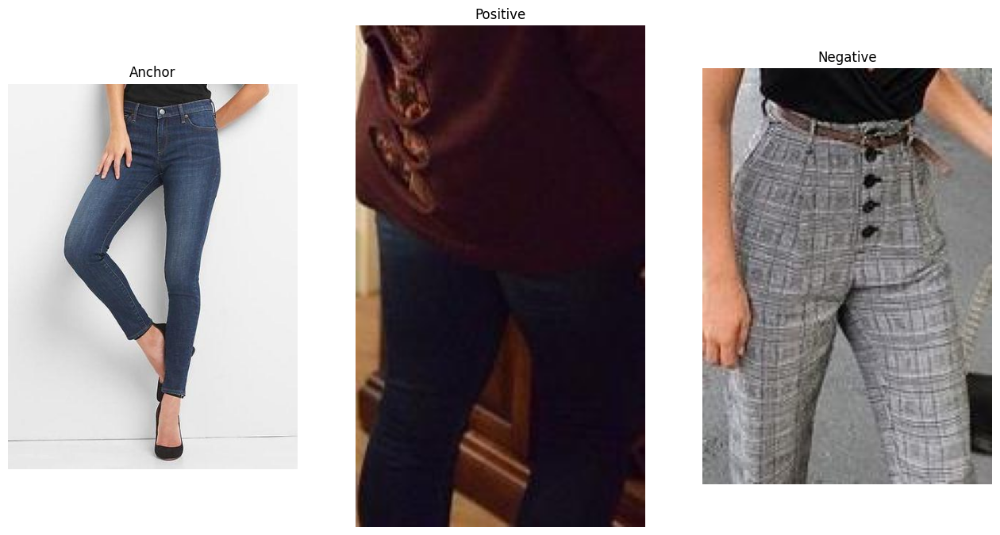

In [38]:
plot_samples(bottom_pairs_csv, random_state=101)

In [24]:
footwear_pairs = download_images(footwear, "footwear")

  6%|▌         | 1419/22706 [00:01<00:21, 969.90it/s]

Error: HTTP Error 403: Forbidden


  8%|▊         | 1925/22706 [00:01<00:20, 1020.70it/s]

Error: HTTP Error 403: Forbidden


 22%|██▏       | 4990/22706 [01:21<1:18:25,  3.77it/s]

Error: <urlopen error [Errno 11001] getaddrinfo failed>


 35%|███▍      | 7879/22706 [38:41<23:26:19,  5.69s/it]

Error: <urlopen error [WinError 10060] A connection attempt failed because the connected party did not properly respond after a period of time, or established connection failed because connected host has failed to respond>


 44%|████▎     | 9903/22706 [1:03:18<17:49:51,  5.01s/it]

Error: <urlopen error [Errno 11001] getaddrinfo failed>


 63%|██████▎   | 14398/22706 [2:09:25<7:37:35,  3.30s/it] 

Error: HTTP Error 403: Forbidden


 66%|██████▌   | 15038/22706 [2:19:56<2:17:57,  1.08s/it]

Error: HTTP Error 403: Forbidden


100%|██████████| 22706/22706 [4:07:11<00:00,  1.53it/s]   


In [25]:
footwear_pairs_csv = pd.DataFrame(footwear_pairs, columns=["anchor", "positive"])
footwear_pairs_csv["negative"] = footwear_pairs_csv["positive"].apply(lambda x: create_negative(footwear_pairs_csv.positive.to_list(), x))
print("Total Pairs: ", footwear_pairs_csv.shape[0])

Total Pairs:  22699


In [26]:
footwear_pairs_csv.isna().sum()

anchor      0
positive    0
negative    5
dtype: int64

In [27]:
footwear_pairs_csv.dropna(inplace=True)
footwear_pairs_csv

,anchor,positive,negative
0,embeddings_train_data\footwear\anchor\0027e308...,embeddings_train_data\footwear\positive\cdab91...,embeddings_train_data\footwear\positive\775b89...
1,embeddings_train_data\footwear\anchor\0027e308...,embeddings_train_data\footwear\positive\14f593...,embeddings_train_data\footwear\positive\1d4b6b...
2,embeddings_train_data\footwear\anchor\0027e308...,embeddings_train_data\footwear\positive\e7d32d...,embeddings_train_data\footwear\positive\a136f7...
3,embeddings_train_data\footwear\anchor\0027e308...,embeddings_train_data\footwear\positive\c0be58...,embeddings_train_data\footwear\positive\a7a427...
4,embeddings_train_data\footwear\anchor\03857e98...,embeddings_train_data\footwear\positive\451ea0...,embeddings_train_data\footwear\positive\0d7b8a...
...,...,...,...
22694,embeddings_train_data\footwear\anchor\e48f7d69...,embeddings_train_data\footwear\positive\5d6848...,embeddings_train_data\footwear\positive\d9cea8...
22695,embeddings_train_data\footwear\anchor\e9f87b2e...,embeddings_train_data\footwear\positive\b197af...,embeddings_train_data\footwear\positive\86d99c...
22696,embeddings_train_data\footwear\anchor\ea242b18...,embeddings_train_data\footwear\positive\e35e84...,embeddings_train_data\footwear\positive\7b5f95...
22697,embeddings_train_data\footwear\anchor\ed806ec9...,embeddings_train_data\footwear\positive\c23aad...,embeddings_train_data\footwear\positive\4c33ee...


In [28]:
footwear_pairs_csv.isna().sum()

anchor      0
positive    0
negative    0
dtype: int64

In [29]:
footwear_pairs_csv.duplicated().sum()

0

In [30]:
#Now lets save this dataframe as a csv
footwear_pairs_csv.to_csv("footwear_pairs.csv", index=False)

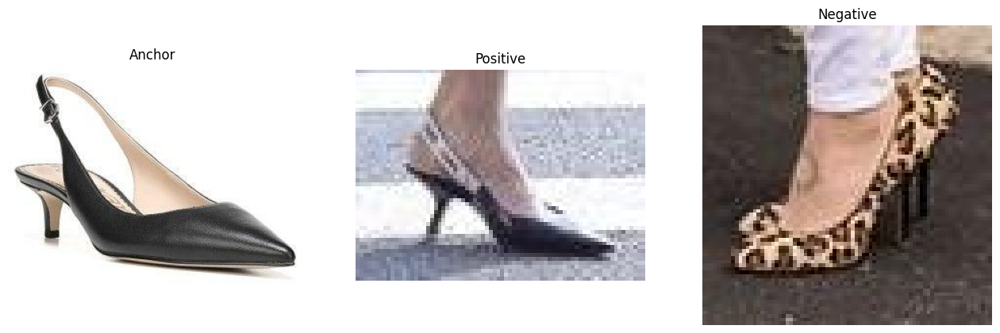

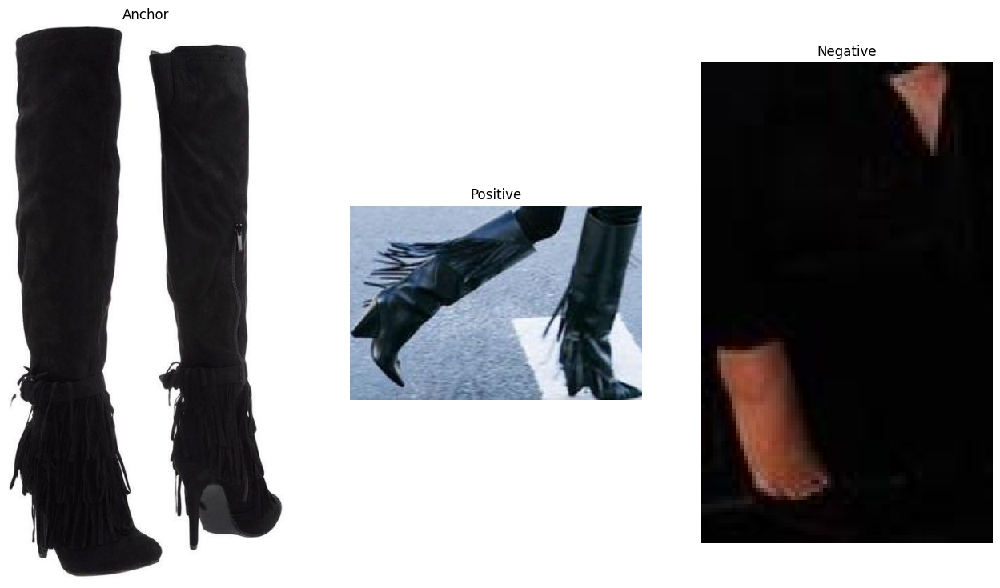

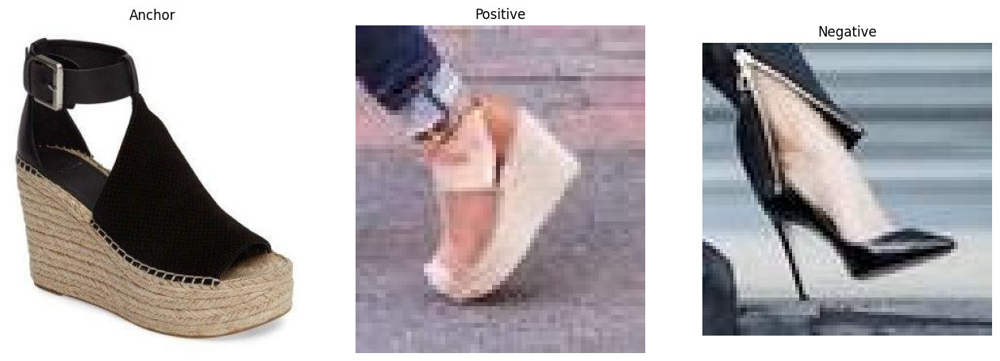

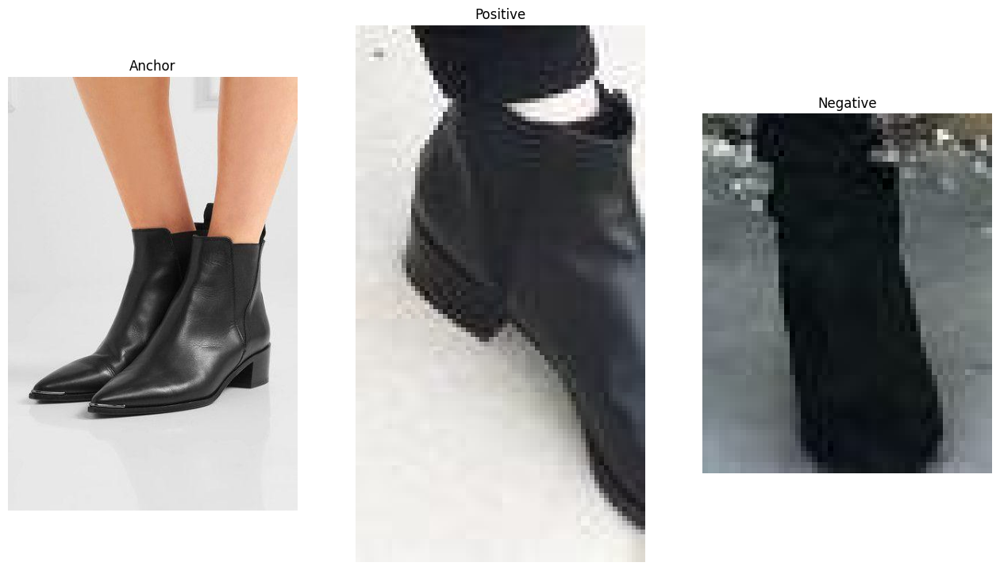

In [33]:
#Now lets see some examples
plot_samples(footwear_pairs_csv,random_state=105)

In [34]:
eyewear_pairs = download_images(eyewear, "eyewear")

 23%|██▎       | 1046/4577 [13:51<24:00,  2.45it/s] 

Error: cannot write empty image as JPEG


100%|██████████| 4577/4577 [45:36<00:00,  1.67it/s]  


In [35]:
eyewear_pairs_csv = pd.DataFrame(eyewear_pairs, columns=["anchor", "positive"])
eyewear_pairs_csv["negative"] = eyewear_pairs_csv["positive"].apply(lambda x: create_negative(eyewear_pairs_csv.positive.to_list(), x))
print("Total Pairs: ", eyewear_pairs_csv.shape[0])

Total Pairs:  4576


In [36]:
eyewear_pairs_csv.isna().sum()

anchor      0
positive    0
negative    6
dtype: int64

In [37]:
eyewear_pairs_csv.duplicated().sum()


0

In [39]:
eyewear_pairs_csv.dropna(inplace=True)
eyewear_pairs_csv

,anchor,positive,negative
0,embeddings_train_data\eyewear\anchor\1070b9c05...,embeddings_train_data\eyewear\positive\2fe273f...,embeddings_train_data\eyewear\positive\35d449d...
1,embeddings_train_data\eyewear\anchor\1a4db76f8...,embeddings_train_data\eyewear\positive\b0c5afb...,embeddings_train_data\eyewear\positive\c031b7f...
2,embeddings_train_data\eyewear\anchor\1a4db76f8...,embeddings_train_data\eyewear\positive\c15293a...,embeddings_train_data\eyewear\positive\dc1589e...
3,embeddings_train_data\eyewear\anchor\1d73b8e91...,embeddings_train_data\eyewear\positive\cfb062f...,embeddings_train_data\eyewear\positive\7650df4...
4,embeddings_train_data\eyewear\anchor\1d73b8e91...,embeddings_train_data\eyewear\positive\87738bb...,embeddings_train_data\eyewear\positive\1a989ac...
...,...,...,...
4571,embeddings_train_data\eyewear\anchor\ecab88ed0...,embeddings_train_data\eyewear\positive\3e0b12d...,embeddings_train_data\eyewear\positive\1f279ed...
4572,embeddings_train_data\eyewear\anchor\134cbb4a0...,embeddings_train_data\eyewear\positive\a19a4bc...,embeddings_train_data\eyewear\positive\d1b4f03...
4573,embeddings_train_data\eyewear\anchor\efebcb1eb...,embeddings_train_data\eyewear\positive\993c03a...,embeddings_train_data\eyewear\positive\7d5417c...
4574,embeddings_train_data\eyewear\anchor\efebcb1eb...,embeddings_train_data\eyewear\positive\c629794...,embeddings_train_data\eyewear\positive\7ff14c3...


In [40]:
#Now lets save this dataframe as a csv
eyewear_pairs_csv.to_csv("eyewear_pairs.csv", index=False)

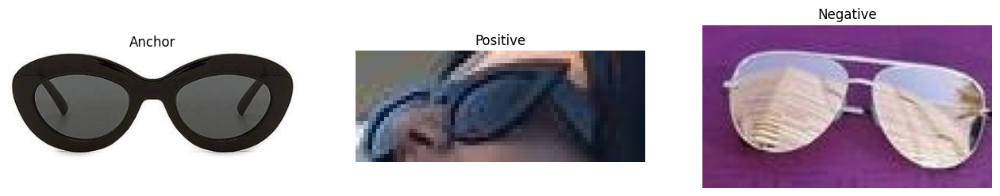

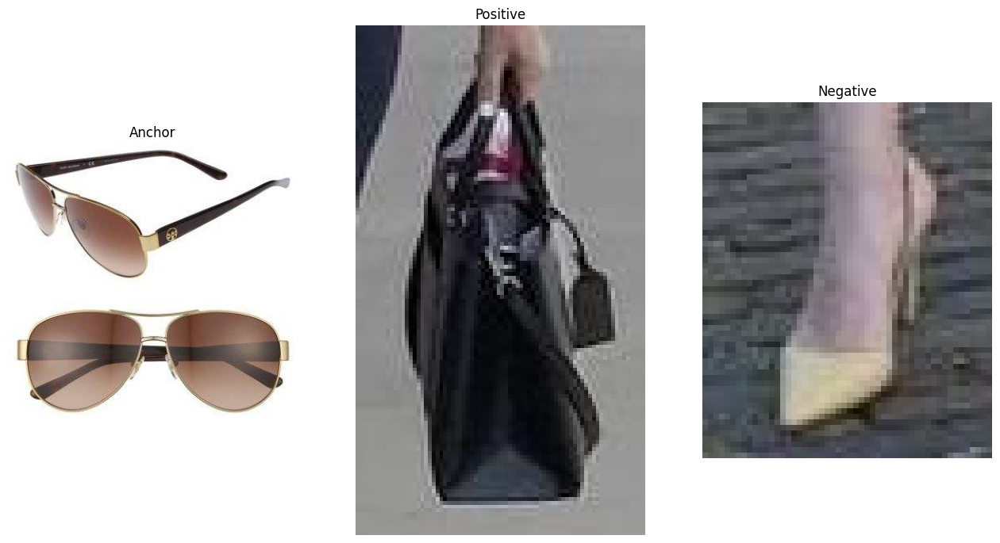

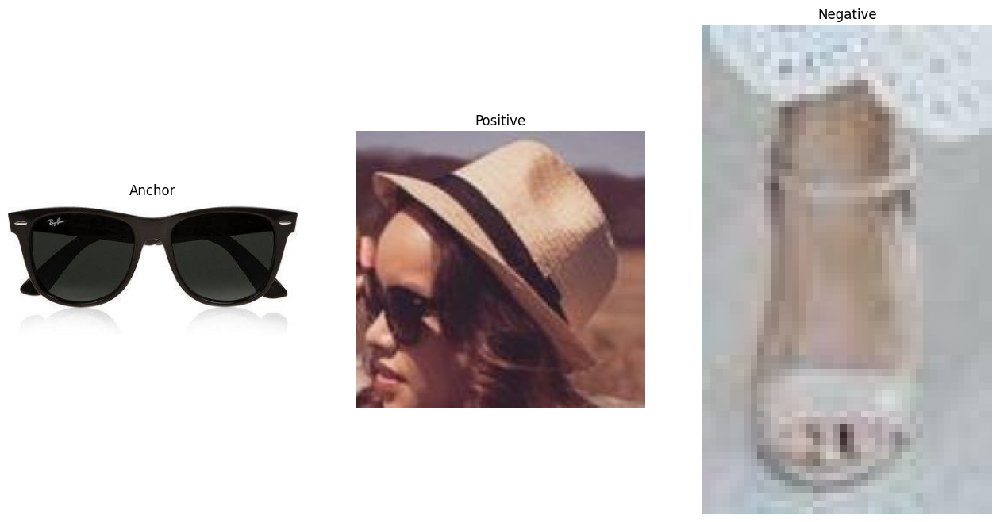

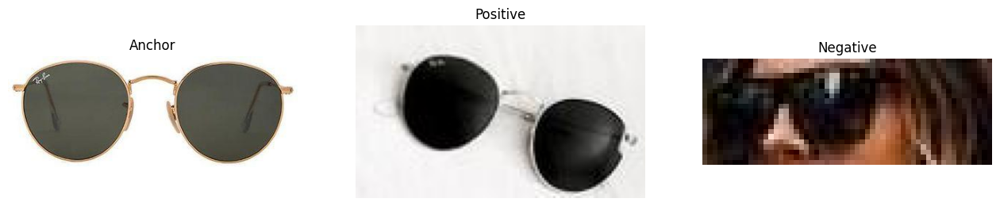

In [48]:
#Now lets see some examples
plot_samples(eyewear_pairs_csv,random_state=110)

In [50]:
handbags_pairs = download_images(handbags, "handbags")

  5%|▌         | 347/6322 [00:00<00:01, 3454.99it/s]

Error: HTTP Error 403: Forbidden


 72%|███████▏  | 4562/6322 [38:31<18:24,  1.59it/s]  

Error: HTTP Error 403: Forbidden


100%|██████████| 6322/6322 [54:05<00:00,  1.95it/s]


In [51]:
handbags_pairs_csv = pd.DataFrame(handbags_pairs, columns=["anchor", "positive"])
handbags_pairs_csv["negative"] = handbags_pairs_csv["positive"].apply(lambda x: create_negative(handbags_pairs_csv.positive.to_list(), x))
print("Total Pairs: ", handbags_pairs_csv.shape[0])

Total Pairs:  6320


In [52]:
handbags_pairs_csv.isna().sum()

anchor      0
positive    0
negative    8
dtype: int64

In [53]:
handbags_pairs_csv.duplicated().sum()

0

In [54]:
handbags_pairs_csv.dropna(inplace=True)
handbags_pairs_csv

,anchor,positive,negative
0,embeddings_train_data\handbags\anchor\002a6586...,embeddings_train_data\handbags\positive\67ed2a...,embeddings_train_data\handbags\positive\04e52e...
1,embeddings_train_data\handbags\anchor\09a7c712...,embeddings_train_data\handbags\positive\6da442...,embeddings_train_data\handbags\positive\b0d55f...
2,embeddings_train_data\handbags\anchor\09a7c712...,embeddings_train_data\handbags\positive\d62bc2...,embeddings_train_data\handbags\positive\16da23...
3,embeddings_train_data\handbags\anchor\09cc5c9c...,embeddings_train_data\handbags\positive\a0b13e...,embeddings_train_data\handbags\positive\f5c7ee...
4,embeddings_train_data\handbags\anchor\0ce9efbc...,embeddings_train_data\handbags\positive\59747e...,embeddings_train_data\handbags\positive\0819e4...
...,...,...,...
6315,embeddings_train_data\handbags\anchor\0a239f88...,embeddings_train_data\handbags\positive\468482...,embeddings_train_data\handbags\positive\5470ce...
6316,embeddings_train_data\handbags\anchor\881a1a33...,embeddings_train_data\handbags\positive\ffd64b...,embeddings_train_data\handbags\positive\2853da...
6317,embeddings_train_data\handbags\anchor\a5942803...,embeddings_train_data\handbags\positive\7ab4b6...,embeddings_train_data\handbags\positive\e1c927...
6318,embeddings_train_data\handbags\anchor\a5942803...,embeddings_train_data\handbags\positive\687742...,embeddings_train_data\handbags\positive\6af722...


In [55]:
#Now lets save this dataframe as a csv
handbags_pairs_csv.to_csv("handbags_pairs.csv", index=False)

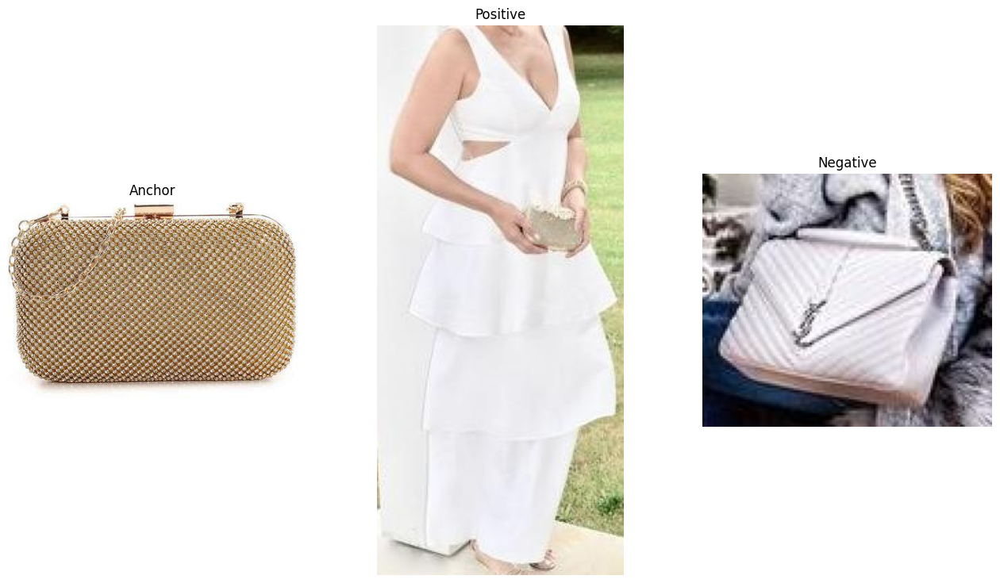

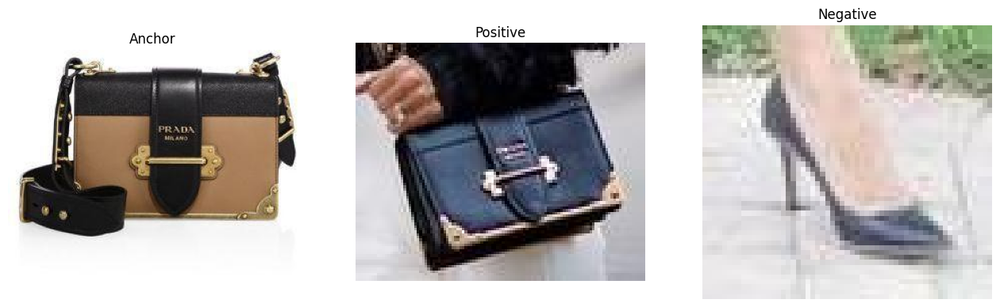

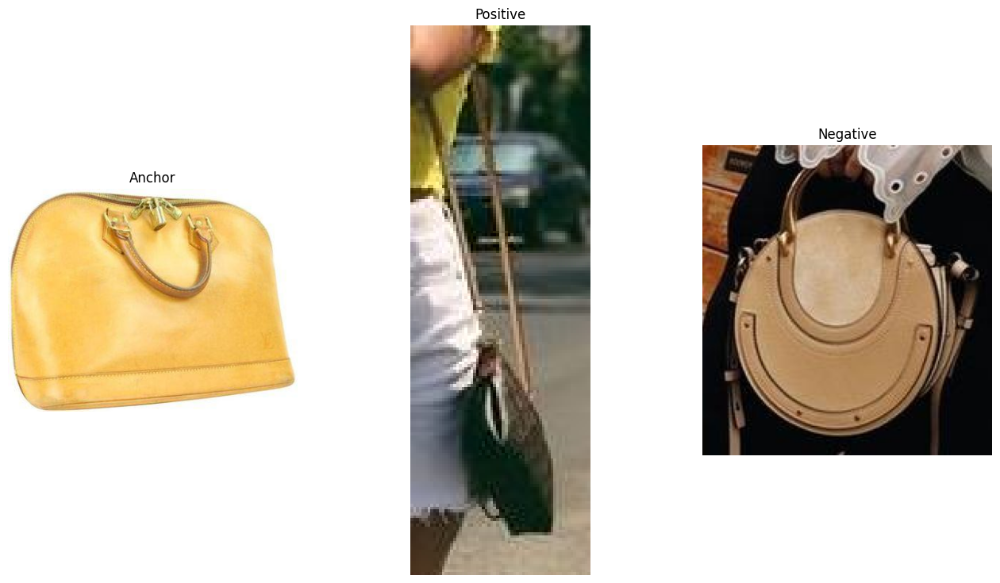

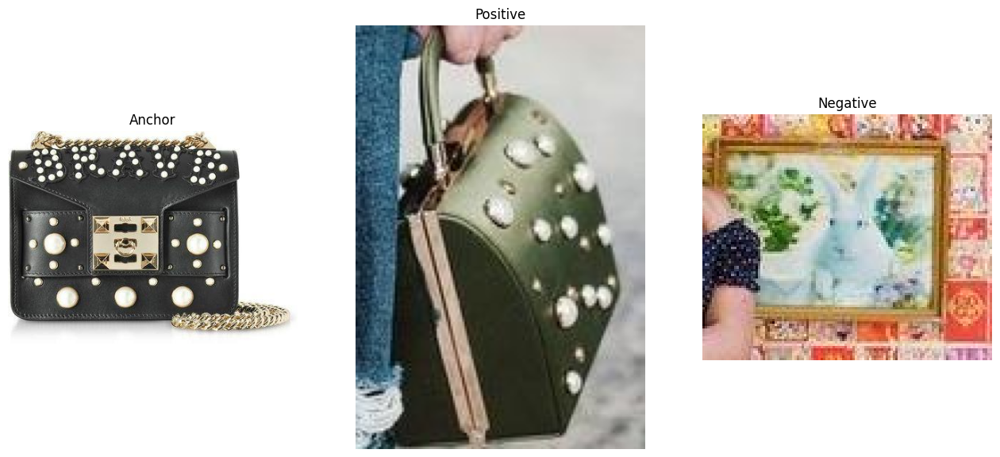

In [56]:
#Now lets see some examples
plot_samples(handbags_pairs_csv,random_state=110)

In [58]:
#I forgot to check for missing values and duplicates for topwear_pairs_csv that we have saved previously. Lets do that
top_pairs_csv = pd.read_csv("./top_pairs.csv")
top_pairs_csv.isna().sum()

anchor      0
positive    0
negative    4
dtype: int64

In [59]:
top_pairs_csv.duplicated().sum()

0

In [60]:
top_pairs_csv.dropna(inplace=True)
top_pairs_csv

,anchor,positive,negative
0,embeddings_train_data\topwear\anchor\06a0ca42c...,embeddings_train_data\topwear\positive\802e1ab...,embeddings_train_data\topwear\positive\e9b3106...
1,embeddings_train_data\topwear\anchor\0b9e3a128...,embeddings_train_data\topwear\positive\de766c8...,embeddings_train_data\topwear\positive\2314a55...
2,embeddings_train_data\topwear\anchor\0bbf2655e...,embeddings_train_data\topwear\positive\3708aa3...,embeddings_train_data\topwear\positive\6a5a5c9...
3,embeddings_train_data\topwear\anchor\0bbf2655e...,embeddings_train_data\topwear\positive\0072b7a...,embeddings_train_data\topwear\positive\dd1d75c...
4,embeddings_train_data\topwear\anchor\0bbf2655e...,embeddings_train_data\topwear\positive\e855d4c...,embeddings_train_data\topwear\positive\8c51f6b...
...,...,...,...
16737,embeddings_train_data\topwear\anchor\ee19c8780...,embeddings_train_data\topwear\positive\e9446f4...,embeddings_train_data\topwear\positive\ff11943...
16738,embeddings_train_data\topwear\anchor\f18617313...,embeddings_train_data\topwear\positive\11577a2...,embeddings_train_data\topwear\positive\39220d9...
16739,embeddings_train_data\topwear\anchor\f47eacd51...,embeddings_train_data\topwear\positive\0a8d63b...,embeddings_train_data\topwear\positive\0197700...
16740,embeddings_train_data\topwear\anchor\f47eacd51...,embeddings_train_data\topwear\positive\31e3620...,embeddings_train_data\topwear\positive\b6316a5...


In [61]:
top_pairs_csv.isna().sum()

anchor      0
positive    0
negative    0
dtype: int64

In [62]:
top_pairs_csv.to_csv("topwear_pairs.csv", index=False)